# Classification and Model Improvement

## Case study : A Prominent  Medical aid scheme in South Africa 

![alt text][image]

[image]: https://cdn.pixabay.com/photo/2022/03/13/01/33/insurance-7065113_1280.png "Title text"

# Table of Contents
1. [Justification](#Justification)
2. [Data Exploration](#Data-Exploration)
3. [Exploratory Data Analysis](#Exploratory-Data-Analysis)
4. [Feature selection](#Feature-selection)
5. [Train model](#Train-model)
6. [Evaluate model](#Evaluate-model)
7. [Retrain model using Ensemble Leaners](#Retrain-model-using-Ensemble-Leaners)
8. [Example: Predicting Tumor Type](#Example:-Predicting-Tumor-Type)
9. [References](#References)

# Justification



## Choice of the dataset
The medical aid chose to start with cancer in order to speed up their ability to apply their dreaded disease benefits to customers that need it. We chose the **Breast Cancer Dataset** due to its quality of data and suitability for this matter.

This dataset, downloaded from Kaggle, contains the characteristics of patients diagnosed with cancer and includes the following information:

* Id : represents a unique ID of each patient
* Diagnosis: indicates the type of cancer (M = Malignant, B = Benign)
* Clinical features: radius_mean, texture_mean, perimeter_mean, area_mean, smoothness_mean, compactness_mean, concavity_mean, concave points_mean (represents the mean values of the cancer's visual characteristics)

link to the dataset : https://www.kaggle.com/datasets/erdemtaha/cancer-data/data

First, in terms of quality, the dataset is clean (without missing values, duplicates, or inconsistencies), well-organized in rows and columns, ready for analysis. Each record contains the patient’s unique ID, the cancer diagnosis, and the average values of the cancer’s visual characteristics. In terms of suitability, the dataset contains labeled data, including both input features  (radius_mean, texture_mean, perimeter_mean, area_mean, smoothness_mean, compactness_mean, concavity_mean, concave points_mean) and the correct output (M = Malignant :dangerous and requires urgent attention , B = Benign: a type of medical condition or growth that is not cancerous or dangerous) making it suitable for the  medical scheme’s goal which is to classify customers based on their cancer diagnosis. 

## Choice of the algorithm

**Logistic regression model** is chosen because it provides a simple and efficient model for binary classification problems like this one, where the task is to predict whether a patient has a benign or malignant tumor. Because the dataset is small, well-structured, and has numerical values as features , logistic regression is a good choice. Although other models like SVM perform well for classification tasks, they often require complex kernel and parameter tuning to avoid overfitting ([Singh, 2024]). KNN relies heavily on large, clean datasets and can struggle with high-dimensional data ([Singh, 2024]). Random forest is powerful but can be computationally expensive and less interpretable ([Baladram, 2024]). In contrast, logistic regression is simple, efficient, computationally inexpensive and works well with smaller datasets, and provides easily interpretable results ([Shaw, 2024]), making it particularly suitable for this breast cancer classification task. Rishabh Singh

[Shaw, 2024]: https://medium.com/@abhishekshaw020/logistic-regression-and-its-role-in-classification-problems-504ff348bb41
[Singh, 2024]: https://medium.com/@RobuRishabh/support-vector-machines-svm-27cd45b74fbb
[Baladram, 2024]: https://medium.com/data-science/random-forest-explained-a-visual-guide-with-code-examples-9f736a6e1b3c


# Data Exploration

## Importing Libraries

We begin this analysis by importing the relevant libraries that will be useful for evaluating the dataset, visualization, processing, and model training.

In [582]:
import numpy as np # Numerical operations 
import pandas as pd # Data manpulatioin
import matplotlib.pyplot as plt # Data visualisaion 
import seaborn as sns # Advanced visualisations
import plotly.express as px # High-level API for creating figures
%matplotlib inline 
import warnings # Set plots to appear under the code cell 
warnings.filterwarnings('ignore') # Ignore warnings messages for cleaning output 
from sklearn.model_selection import train_test_split  # Split dataset into training and testing sets
from sklearn.pipeline import Pipeline                  # Create machine learning workflows
from sklearn.preprocessing import MinMaxScaler         # Scale features to a given range (usually 0 to 1)
from sklearn.decomposition import PCA                   # Reduce dimensionality of data using Principal Component Analysis
from sklearn.linear_model import LogisticRegression     # Perform classification using logistic regression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix  # Metrics to evaluate model performance
from sklearn.ensemble import RandomForestClassifier  # Random Forest classifier
from sklearn.svm import SVC  # Support Vector Machine classifier
import xgboost as xgb # XGBoost library
from sklearn.neighbors import KNeighborsClassifier  # K-Nearest Neighbors classifier
from sklearn.model_selection import KFold  #  K-Fold cross-validation
from sklearn.model_selection import cross_val_score  # For evaluating model using cross-validation scores
from sklearn.model_selection import cross_val_predict  # For getting predictions during cross-validation
from IPython.display import display, HTML # Display and HTML functions


## Loading the dataset

Let's now look at the dataset to have an overview of its content 

In [66]:
# Load data and display the first ten rows
df = pd.read_csv('data.csv')
df.head(5)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


## Interpreting the content of the dataset

Here we are going to interpret the contents of the dataset to gain a better understanding of its structure

###  Dimension

In [70]:
# Show the dimensions of the dataset
df.shape

(569, 33)

### Information 

Here we get a summary of the dataset, including the number of rows, columns, the name of columns , the number of non null values , the types of columns and the memory usage 

In [73]:
# Show information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

###  Unnecessary Column 


Let's remove unnecessary column

In [76]:
df = df.drop(['id','Unnamed: 32'], axis=1)

###  Summary

Here we get a statistical summary of the numerical columns (age, bmi, children, charges)  in  the dataset, including some statistical metrics as shown below 

In [79]:
# Show summary statistics only for numeric columns
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


## Cleaning Data

###  Missing values

Let's check if the dataset contains missing values

In [83]:
# Count the missing values in the dataset
df.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

###  Duplicates

Let's check if the dataset contains duplicate values

In [86]:
# Count the duplicated row
df.duplicated().sum()

0

# Exploratory Data Analysis

## Pie chart Distribution 

Patients diagnosis with benign:  357
Patients diagnosis with  Malignant:  212


<Figure size 2700x1800 with 0 Axes>

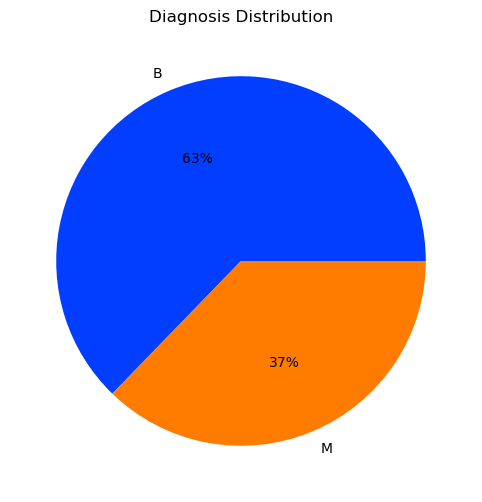

In [90]:
# Diagnosis Distribution

# Extract  the 'diagnosis' column
diagnosis_col = df['diagnosis'] 
# Get the count of each diagnosis type
diagnosis_col_count = diagnosis_col.value_counts()
print('Patients diagnosis with benign: ', diagnosis_col_count[0])
print('Patients diagnosis with  Malignant: ', diagnosis_col_count[1])
# Set the index to ensure that labels match the order of the counts 
labels = diagnosis_col_count.index 
# Set a color 
palette_color = sns.color_palette('bright') 
# Set size
plt.figure(figsize=(12, 6))  
# Create a pie chart
plt.pie(diagnosis_col_count, labels=labels, colors=palette_color,autopct='%.0f%%') 
# Title of the pie chart 
plt.title('Diagnosis Distribution') 
# Display the pie chart 
plt.show() 

we can observe that approximately 63% of patients are diagnosed with benign tumors, while 37% have malignant tumors.

## Scatter Plot Distribution

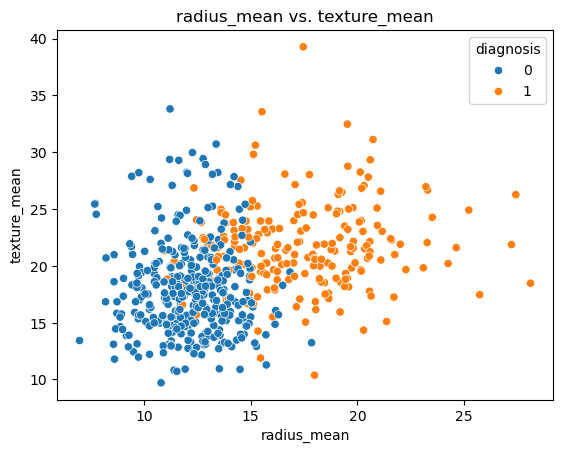

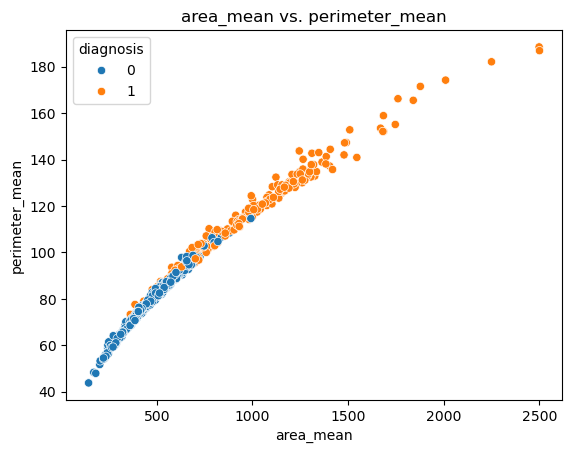

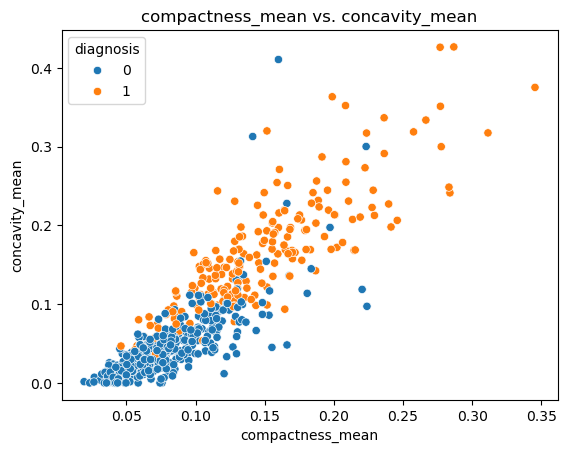

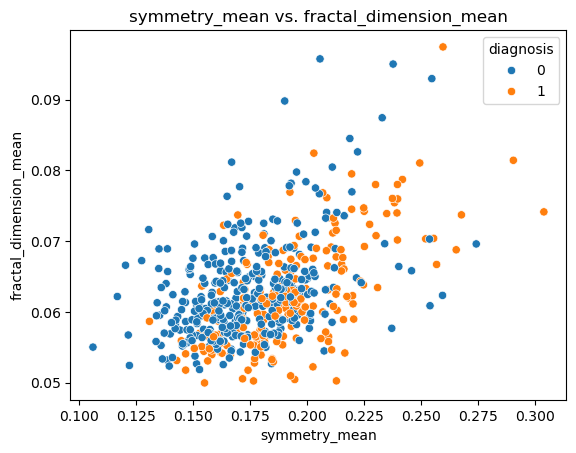

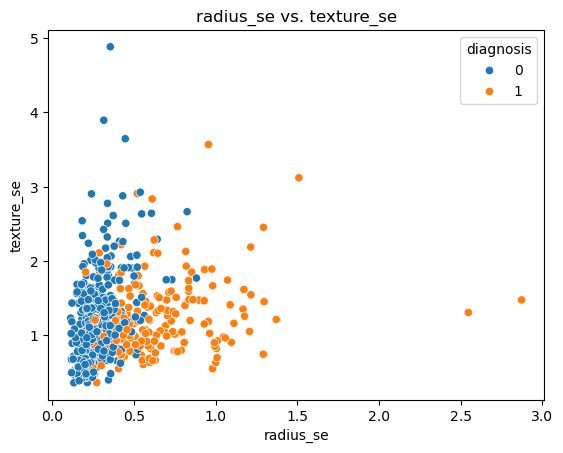

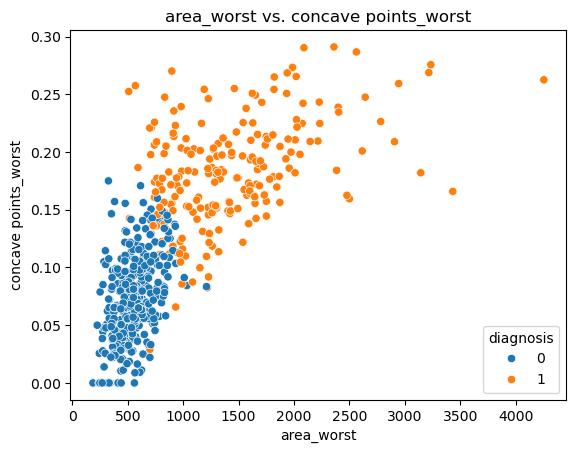

In [187]:
# Display a few selected feature pairs
feature_pairs = [
    ('radius_mean', 'texture_mean'),
    ('area_mean', 'perimeter_mean'),
    ('compactness_mean', 'concavity_mean'),
    ('symmetry_mean', 'fractal_dimension_mean'),
    ('radius_se', 'texture_se'),
    ('area_worst', 'concave points_worst')
]
# # Loop through selected feature pairs
for i, (x_feat, y_feat) in enumerate(feature_pairs):
    # Create the scatter plot
    sns.scatterplot(x=x_feat, y=y_feat, hue='diagnosis', data=df)
    # Set title 
    title = f"{x_feat} vs. {y_feat}"
    plt.title(title)
    # Display plot
    plt.show()

The scatter plots show a clear separation between the two classes, indicating that the most features  are effective for distinguishing between benign and malignant class.

## Histogram Distribution

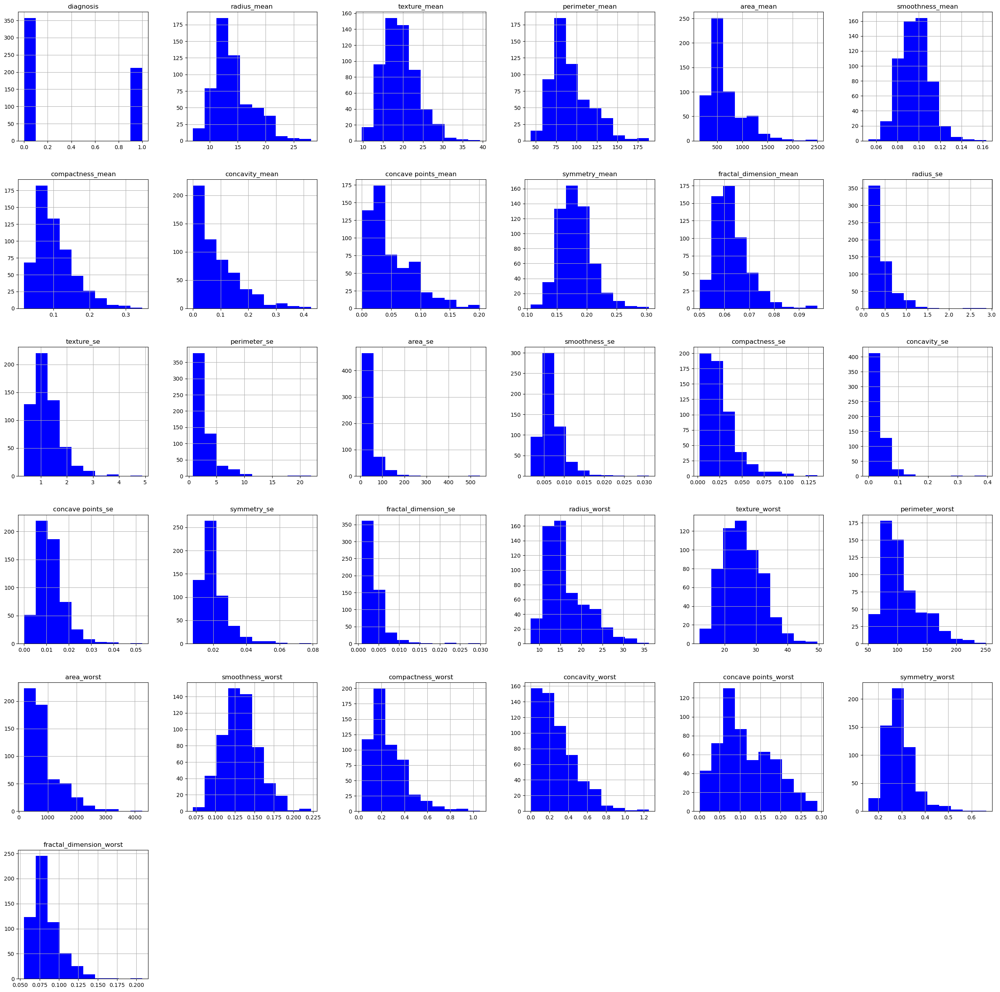

In [199]:
# Display Histograms
df.hist(figsize = (32,32), color = 'blue')
plt.show()

The histograms show that most features are right-skewed. This suggests the need for scaling or transformation before model training.

## Pair Plot Distribution 



In [93]:
# Plot  pairwise relationships  

# Create the pairplot with KDE on the diagonal 
sns.pairplot(df,diag_kind='kde',palette ="blue") 
# Display the plot
plt.show() 

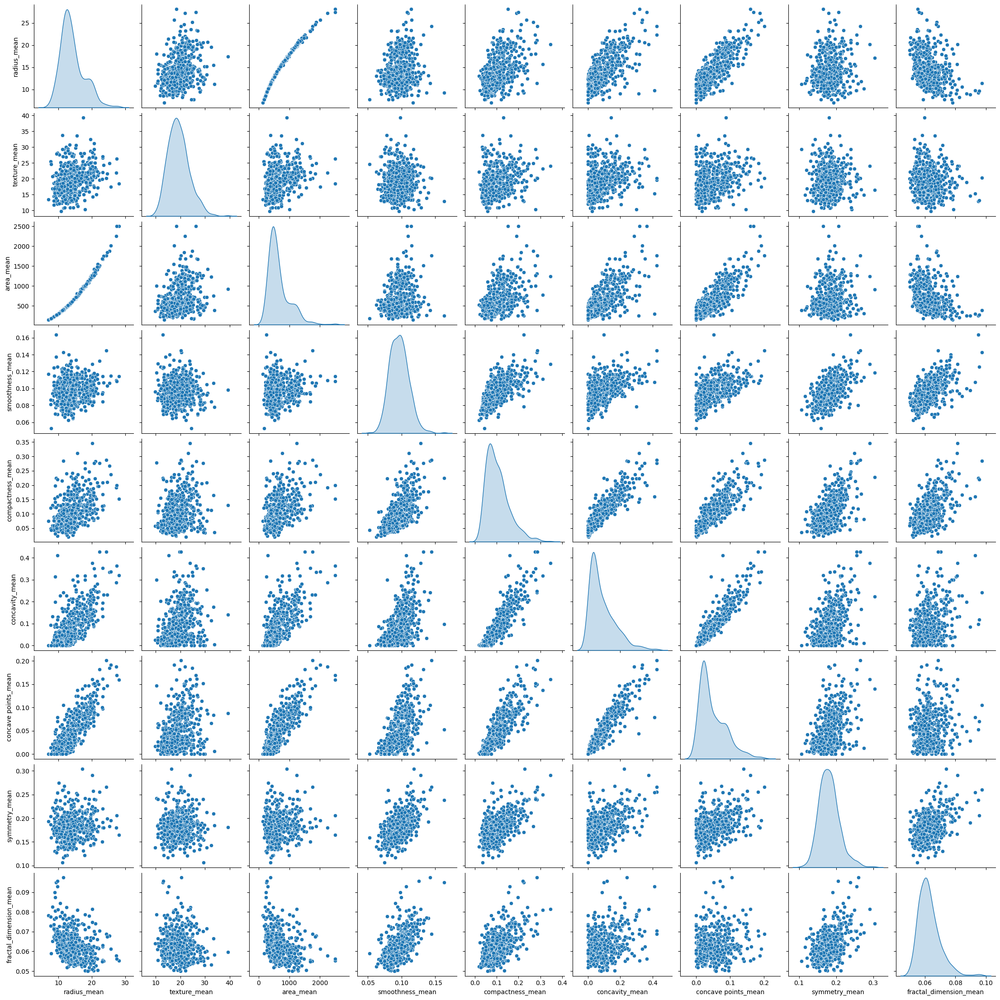

In [95]:
# Plot  pairwise relationships  for mean features

# Extract all mean features
df_sel = df[['radius_mean', 'texture_mean', 'area_mean',
             'smoothness_mean','compactness_mean','concavity_mean',
            'concave points_mean','symmetry_mean','fractal_dimension_mean']]
# Create the pairplot with KDE on the Diagonal
sns.pairplot(df_sel,diag_kind='kde',palette = "blue") 
# Display the plot
plt.show() 


The diagonal plots show the kde-plots distribution for each mean features, while the upper and lower triangles display the pairwise relationships between features.

## Box Plot Distribution

Visualize the data distributions for the mean (mean) values, standard error(se) values, and worst(worst) value.

In [98]:
# Function for creating plots
def visualize_box(data, name_feature):
    # Reshape the dataframe 
    df_melted = pd.melt(df, id_vars='diagnosis', value_vars=data, var_name='Feature', value_name='Value')        
    # Create a box plot
    fig = px.box(df_melted, x='diagnosis', y='Value', color='Feature', title=f"Distribution of {name_feature} features by Diagnosis")
    # Set size
    fig.update_layout(width=1000, height=900)
    # Display the plot
    fig.show()

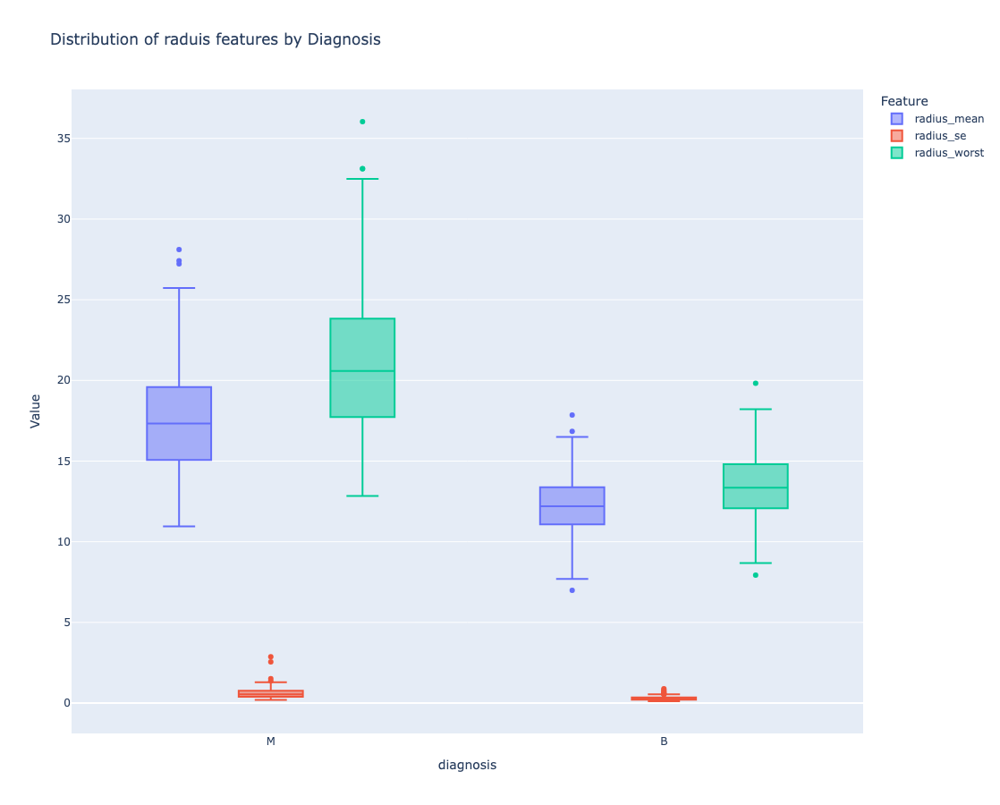

In [100]:
# Display distribution of radius features
df_diag = ['radius_mean', 'radius_se', 'radius_worst']
name_feature = 'raduis'
visualize_box(df_diag,name_feature)

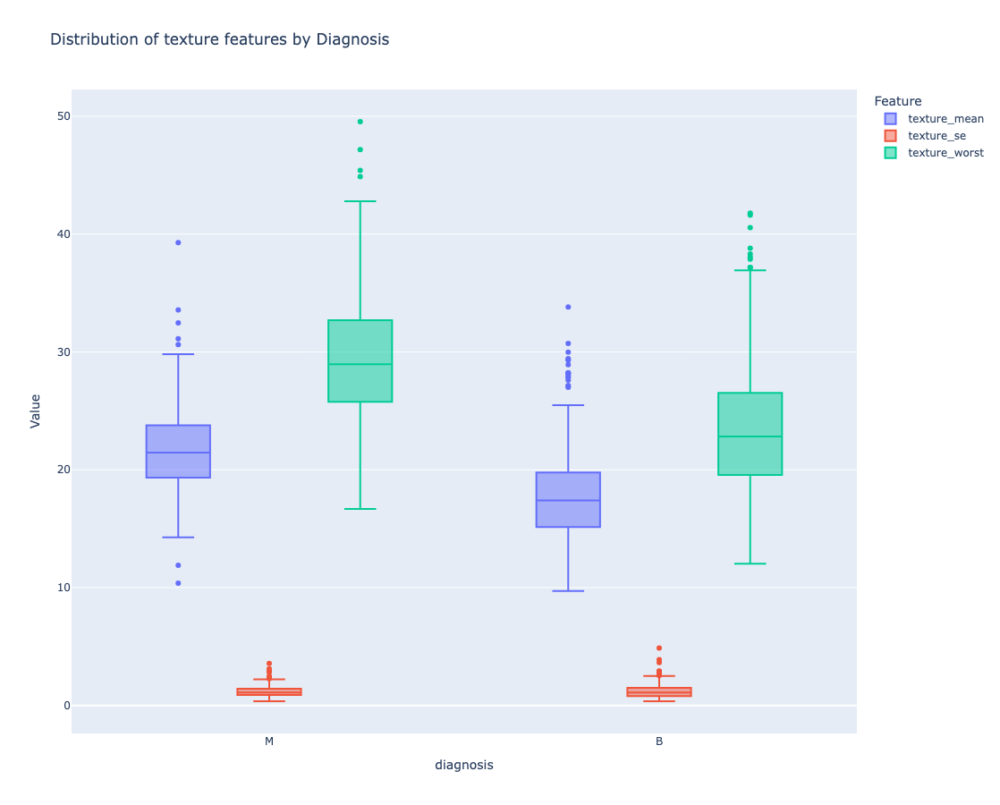

In [102]:
# Display distribution of texture features
df_diag = ['texture_mean', 'texture_se', 'texture_worst']
name_feature = 'texture'
visualize_box(df_diag,name_feature)

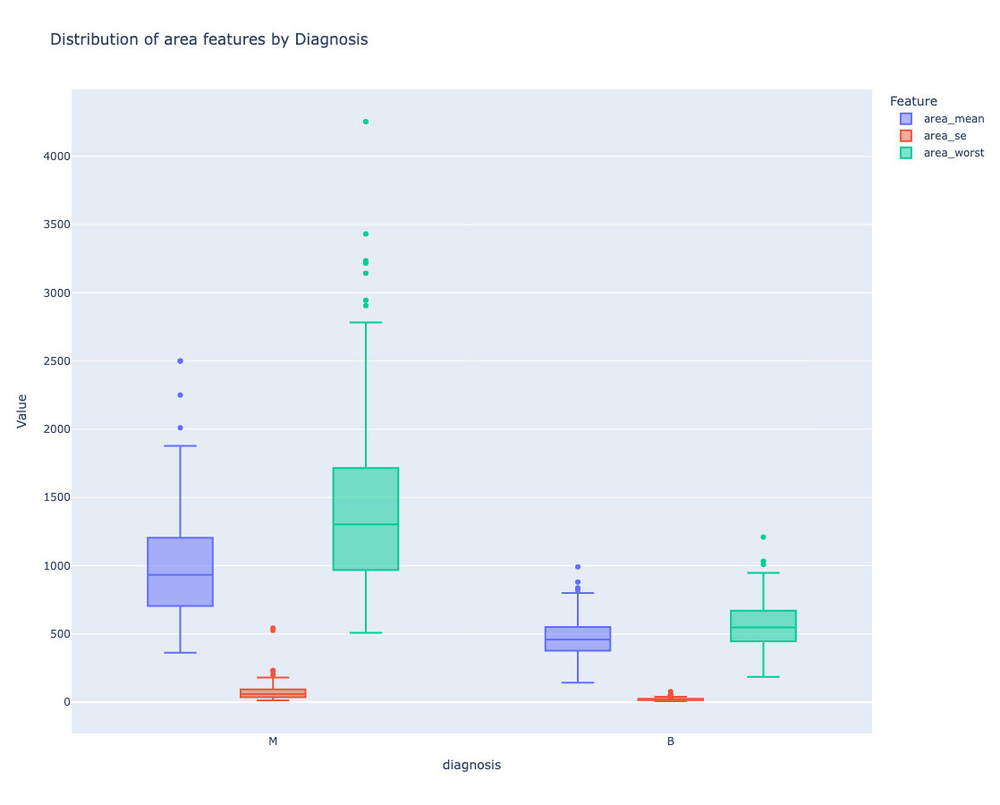

In [104]:
# Display distribution of area features
df_diag = ['area_mean', 'area_se', 'area_worst']
name_feature = 'area'
visualize_box(df_diag,name_feature)

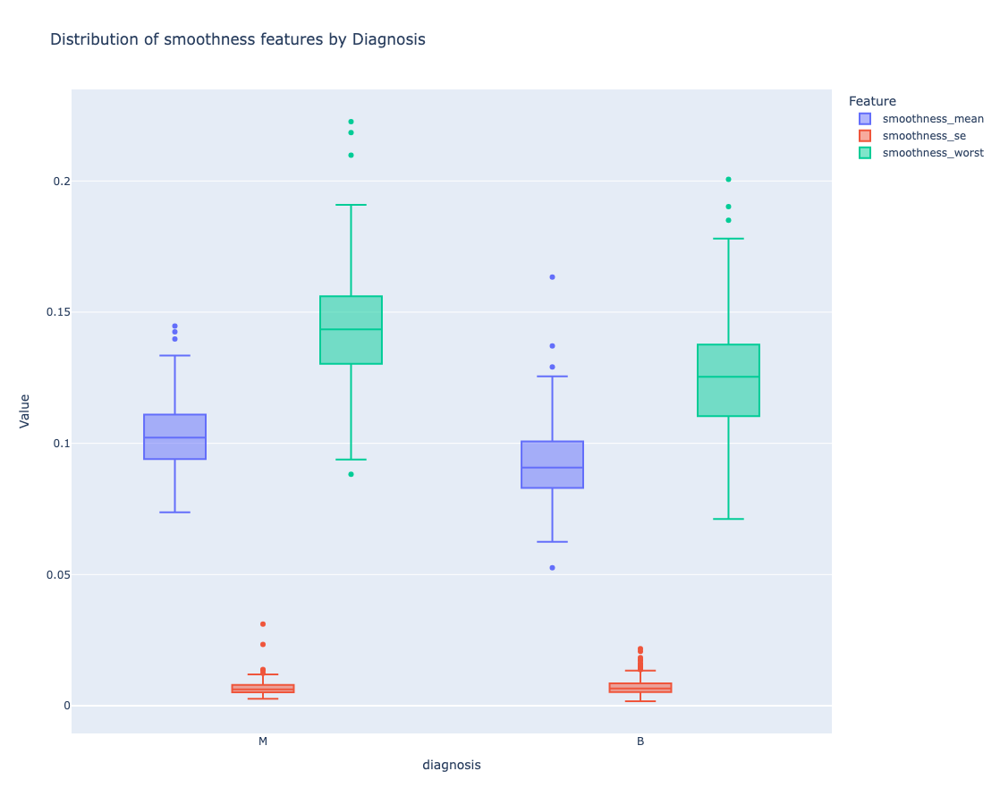

In [106]:
# Display distribution of smoothness features
df_diag = ['smoothness_mean', 'smoothness_se', 'smoothness_worst']
name_feature = 'smoothness'
visualize_box(df_diag,name_feature)

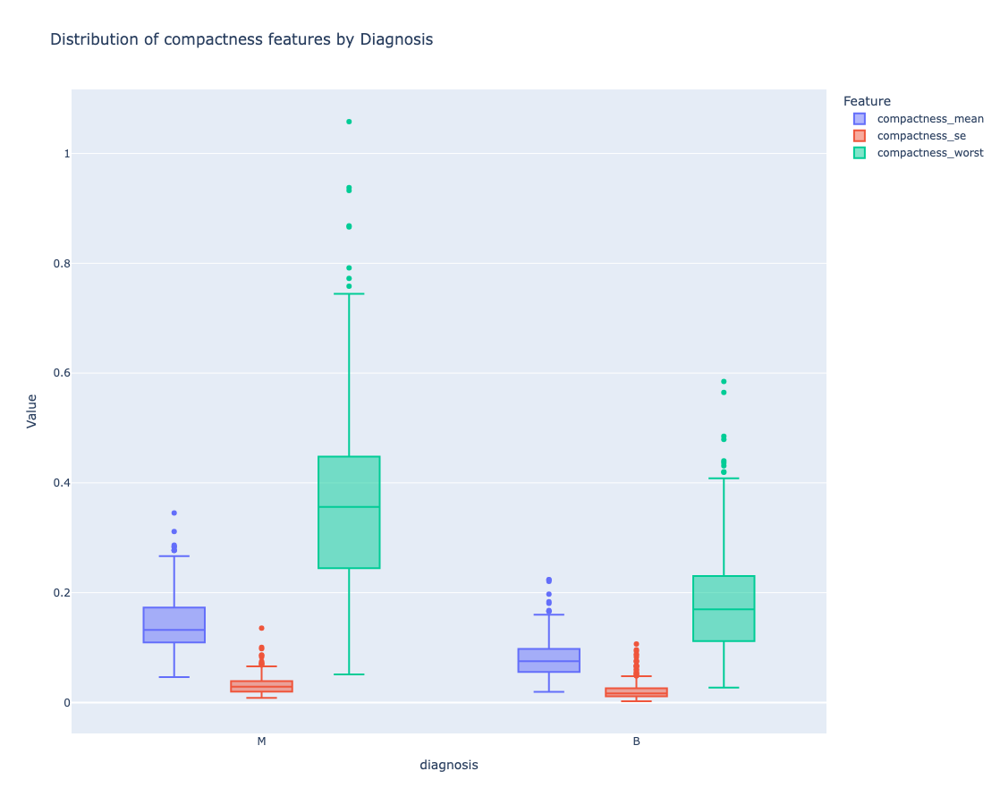

In [108]:
# Display distribution of compactness features
df_diag = ['compactness_mean', 'compactness_se', 'compactness_worst']
name_feature = 'compactness'
visualize_box(df_diag,name_feature)

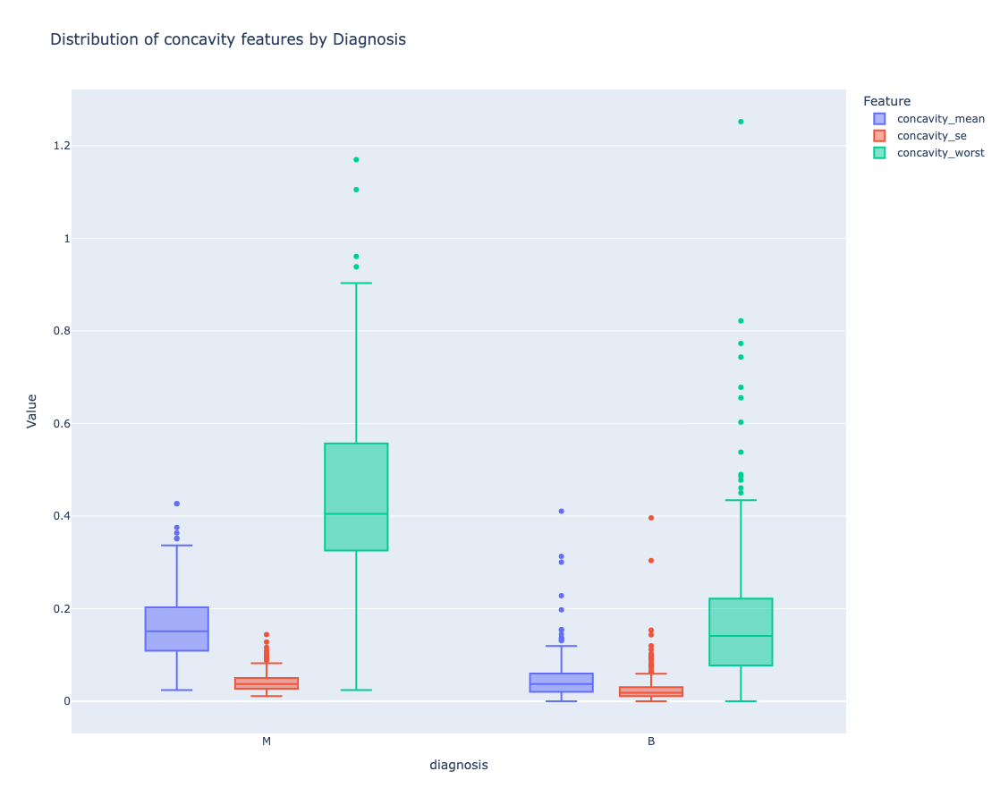

In [110]:
# Display distribution of concavity features
df_diag = ['concavity_mean', 'concavity_se', 'concavity_worst']
name_feature = 'concavity'
visualize_box(df_diag,name_feature)

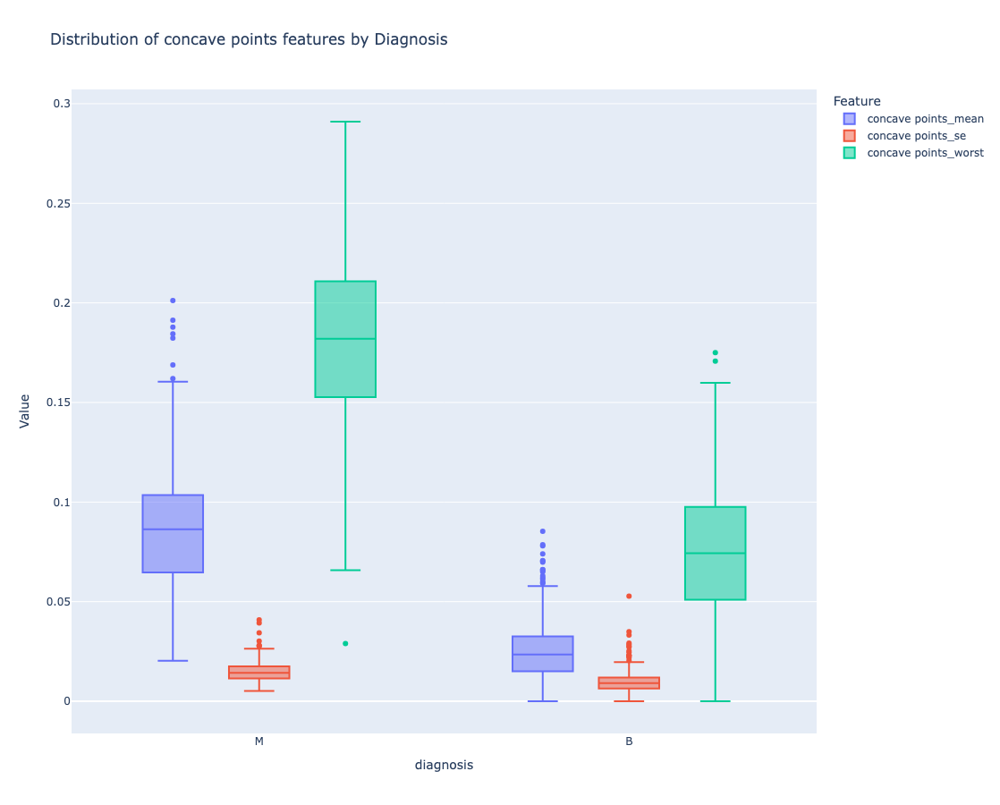

In [112]:
# Display distribution of concave point features
df_diag = ['concave points_mean', 'concave points_se', 'concave points_worst']
name_feature = 'concave points'
visualize_box(df_diag,name_feature)

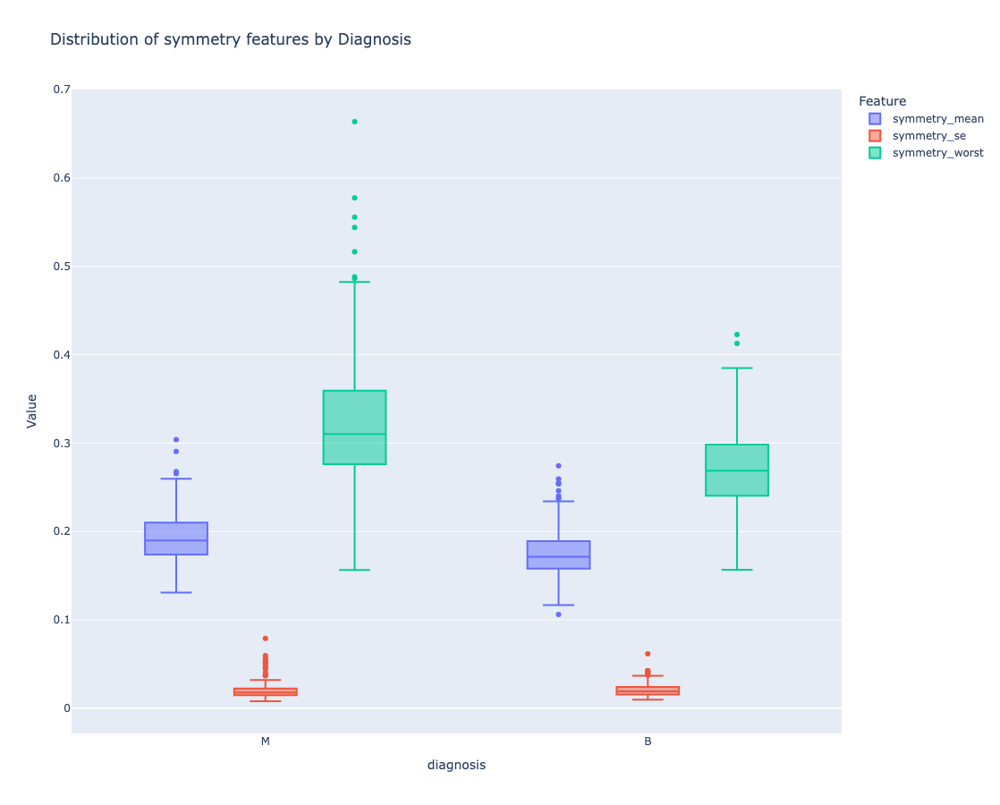

In [114]:
# Display distribution of symmetry features
df_diag = ['symmetry_mean', 'symmetry_se', 'symmetry_worst']
name_feature = 'symmetry'
visualize_box(df_diag,name_feature)

Each of the features have outliers as shown in the boxplot and therefore needs to be addressed during data preprocessing.

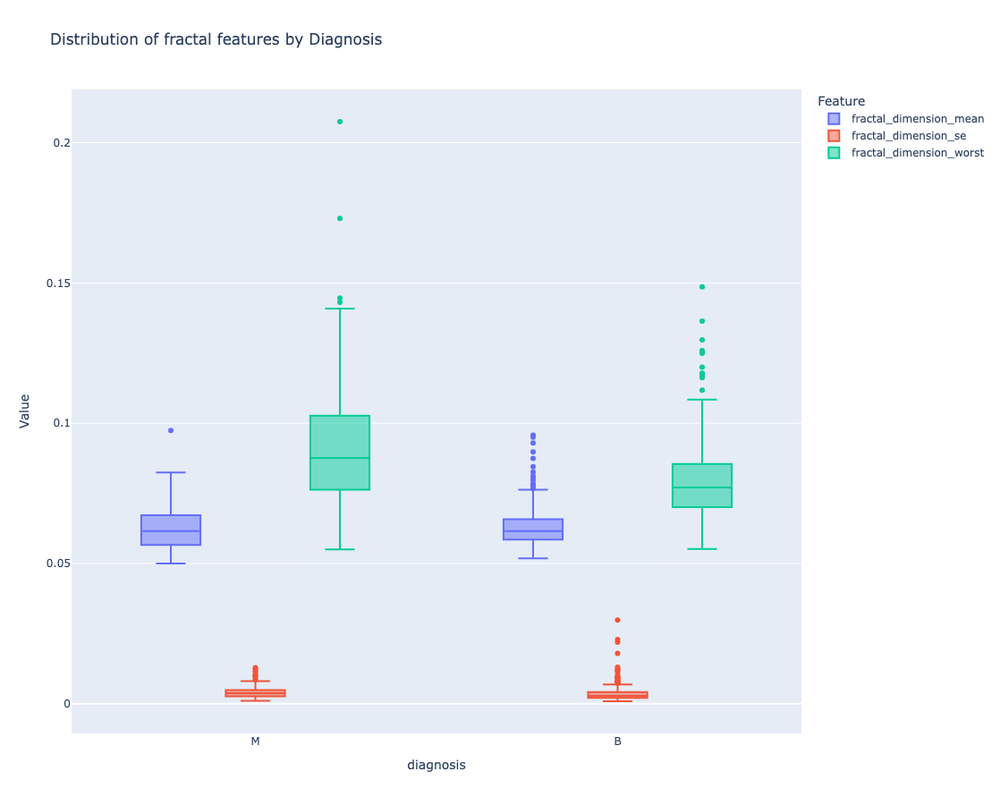

In [116]:
# Display distribution of fractal features
df_diag = ['fractal_dimension_mean', 'fractal_dimension_se', 'fractal_dimension_worst']
name_feature = 'fractal'
visualize_box(df_diag,name_feature)

There are outliers in each of these features as shown in the boxplot and therefore needs to be addressed during data preprocessing.

## Correlation Heatmap 

<Figure size 2700x1800 with 0 Axes>

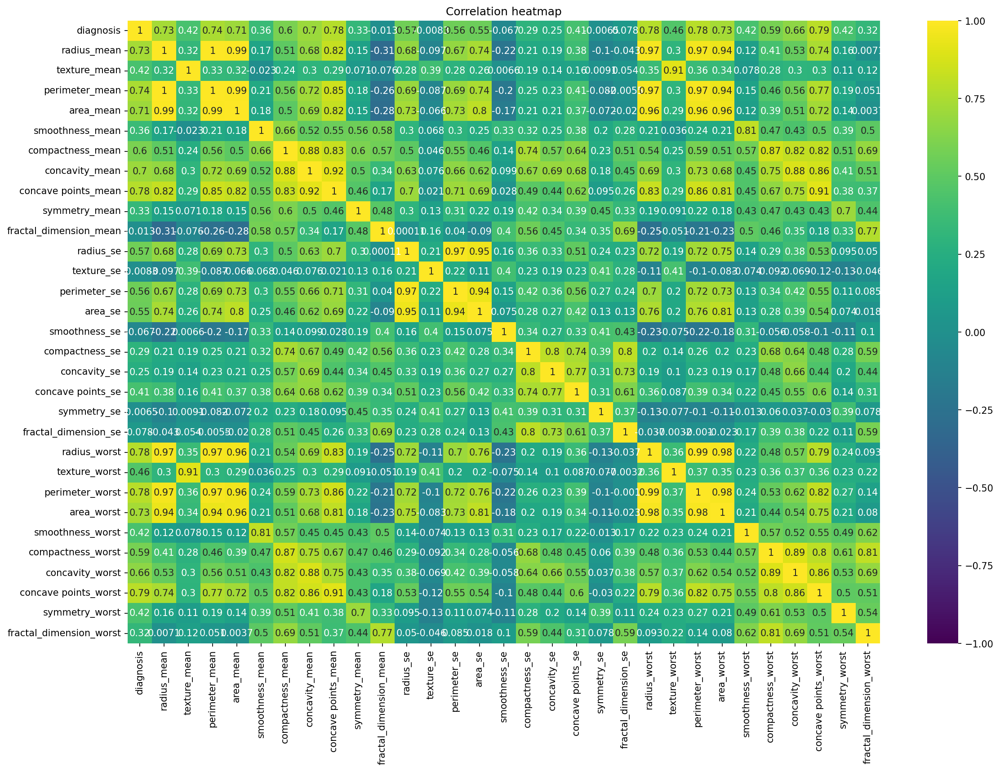

In [120]:
# Create and display the correlation heatmap

# Convert from text to binary 
df['diagnosis'] = df['diagnosis'].map({'M': 1, 'B': 0})
# Set size
plt.figure(figsize=(18,12),dpi=150) 
# Create the correlation heatmap
sns.heatmap(df.corr(),annot=True,cmap='viridis',vmin=-1,vmax=1)  
# Set title
plt.title("Correlation heatmap")
# Display the correlation heatmap
plt.show() 

We can observe that most of  variables are highly correlated with others. For instance, radius, area, and perimeter show a strong  correlation (corr_value = 0.90). This indicates the presence of **multicollinearity** in the data

# Feature selection

In [205]:
# Select feature and split the data before training the model 

# Select the input features and the the class 
X = df.drop(['diagnosis'], axis = 1)
y = df['diagnosis']
# Splitting the data into training set and testset
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 42)

# Train model

We use :
* MinmMaxScaler : scale features to a specific range
* PCA : reduce multicollinearity and dimensionality in the data
* logistic Regression : train the classification model 

In [211]:
#  Creating pipeline
logisticPipeline = Pipeline([('mysccaler',MinMaxScaler()),
                         ('mypca',PCA(n_components=5)),
                         ('logistic_classifier', LogisticRegression())
                        
                        ])

In [213]:
#  Fit the pipeline on the training data
logisticPipeline.fit(X_train, y_train)

Pipeline(steps=[('mysccaler', MinMaxScaler()), ('mypca', PCA(n_components=5)),
                ('logistic_classifier', LogisticRegression())])

# Evaluate model

In [216]:
# Make predictions
predictions = logisticPipeline.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, predictions))
print("\nClassification Report:\n", classification_report(y_test, predictions))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, predictions))

Accuracy: 0.9824561403508771

Classification Report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.99        71
           1       1.00      0.95      0.98        43

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114


Confusion Matrix:
 [[71  0]
 [ 2 41]]


The logistic regression model performs well, with an accuracy of about 98.25%. It correctly predicts the diagnosis of cancer, whether it is class B or class M . The precision for benign tumors is 97%  and 1.00 for malignant tumors. The recall values are high for benign (1.00) and malignant (0.95) tumors, and the f1 score is also higher for both, demonstrating the reliability of the model.

# Retrain model using Ensemble Leaners

In [219]:
# Model Class to be used for different ML algorithms
class ClassifierModel(object):

    # Initialisation function
    def __init__(self, clf, params=None):
        self.clf = clf(**params)
     # Training function
    def train(self, x_train, y_train):
        self.clf.fit(x_train, y_train)
     # Fitting function
    def fit(self,x,y):
        return self.clf.fit(x,y)
     # Important features function
    def feature_importances(self,x,y):
        return self.clf.fit(x,y).feature_importances_
     # Prediction function
    def predict(self, x):
        return self.clf.predict(x)

In [221]:
# Create Numpy arrays of train, test and target ( Diagnosis) dataframes to feed into our models
y_train = df['diagnosis'].ravel()
train = df.drop(['diagnosis'], axis=1)
# Creates an array of the train and test  data
x_train = train.values 
x_test = train.values 

In [223]:
# Training  model functiion
def trainModel(model, x_train, y_train, x_test, n_folds, seed):
    cv = KFold(n_splits= n_folds)
    scores = cross_val_score(model.clf, x_train, y_train, scoring='accuracy', cv=cv, n_jobs=-1)
    y_pred = cross_val_predict(model.clf, x_train, y_train, cv=cv, n_jobs=-1)
    return scores, y_pred

In [225]:
# Random Forest parameters
rf_params = {
    'n_estimators': 400,
    'max_depth': 5,
    'min_samples_leaf': 3,
    'max_features' : 'sqrt',
    'random_state' : 42,
}

# KNN  parameters
knn_params = {
    'n_neighbors': 5,
    'algorithm': 'auto',
    'p': 2
}

# SVM parameters
svm_params = {
    'C': 1.0,               
    'kernel': 'rbf',         
    'gamma': 'scale',        
    'random_state': 42
}

# Logistic Regression parameters
logr_params = {
    'solver': 'liblinear',     
    'penalty': 'l2',          
    'C': 1.0,                  
    'random_state': 42
}

In [227]:
# Create an instance of the classifier model

rfc_model = ClassifierModel(clf=RandomForestClassifier, params=rf_params)
knn_model = ClassifierModel(clf=KNeighborsClassifier, params=knn_params)
svm_model = ClassifierModel(clf=SVC, params=svm_params)
logr_model = ClassifierModel(clf=LogisticRegression, params=logr_params)

# Train the  model  and returns : cross-validation scores and predictions on the training set

rfc_scores, rfc_train_pred = trainModel(rfc_model, x_train, y_train, x_test, 5, 0)
knn_scores, knn_train_pred = trainModel(knn_model,x_train, y_train, x_test, 5, 0)
svm_scores, svm_train_pred = trainModel(svm_model, x_train, y_train, x_test, 5, 0)
logr_scores, logr_train_pred = trainModel(logr_model, x_train, y_train, x_test, 5, 0)


In [230]:
# Display the accuracy scores from different models on five folds
acc_pred_train = pd.DataFrame ({'RandomForest': rfc_scores.ravel(),
     'KNN': knn_scores.ravel(),
      'SVM': svm_scores.ravel(),
      'Logistic': logr_scores.ravel()
    })
acc_pred_train.head()

,RandomForest,KNN,SVM,Logistic
0,0.903509,0.859649,0.771930,0.912281
1,0.938596,0.921053,0.903509,0.947368
2,0.973684,0.964912,0.973684,0.973684
3,0.956140,0.947368,0.938596,0.973684
4,0.973451,0.938053,0.946903,0.955752


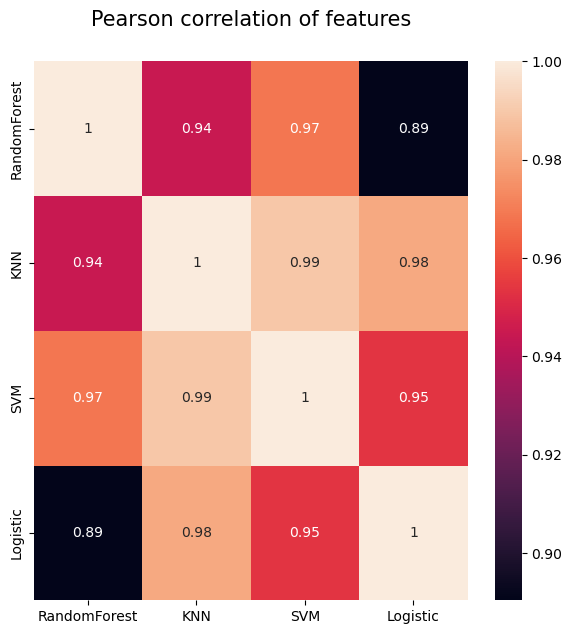

In [232]:
# Display the correlation heatmap between the accuracy scores of different models
colormap = plt.cm.RdBu
plt.figure(figsize=(7,7))
plt.title('Pearson correlation of features', y=1.05, size=15)
sns.heatmap(acc_pred_train.astype(float).corr(), annot=True)
plt.show()

The figure above shows the correlation heatmap of model performance across different levels. Highly correlated models tend to behave similarly. For example, KNN and Random Forest show a high correlation, indicating similar behavior. In contrast, logistic regression and KNN show a weaker correlation, suggesting that their predictions differ across levels.

In [237]:
# Combine all  predictions into a single feature
x_train = np.column_stack(( rfc_train_pred, knn_train_pred, svm_train_pred, logr_train_pred))

In [239]:
# Show the dimension
x_train.shape

(569, 4)

In [241]:
# Display the accuracy scores for each model accros 5 folds
acc_pred_train.head()

,RandomForest,KNN,SVM,Logistic
0,0.903509,0.859649,0.771930,0.912281
1,0.938596,0.921053,0.903509,0.947368
2,0.973684,0.964912,0.973684,0.973684
3,0.956140,0.947368,0.938596,0.973684
4,0.973451,0.938053,0.946903,0.955752


In [243]:
# Function  combine the predictions from multiple contributing classifiers.

def trainStackModel(x_train, y_train, x_test, n_folds, seed):
    cv = KFold(n_splits= n_folds)
    gbm = xgb.XGBClassifier(
     n_estimators= 2000,
     max_depth= 4,
     min_child_weight= 2,
     gamma=0.9,                        
     subsample=0.8,
     colsample_bytree=0.8,
     objective= 'binary:logistic',
     scale_pos_weight=1).fit(x_train, y_train)
    
    scores = cross_val_score(gbm, x_train, y_train, scoring='accuracy', cv=cv)
    return scores

In [245]:
# Train the Stacked ensemble model
stackModel_scores = trainStackModel(x_train, y_train, x_test, 5, 0)

In [247]:
# Add the Stacking model score to the Dataframe and display the  accuracy for all 
acc_pred_train['stackingModel'] = stackModel_scores
acc_pred_train

,RandomForest,KNN,SVM,Logistic,stackingModel
0,0.903509,0.859649,0.771930,0.912281,0.894737
1,0.938596,0.921053,0.903509,0.947368,0.956140
2,0.973684,0.964912,0.973684,0.973684,0.991228
3,0.956140,0.947368,0.938596,0.973684,0.964912
4,0.973451,0.938053,0.946903,0.955752,0.955752


In [249]:
# Compute the average accuracy 
acc_pred_train.mean()

RandomForest     0.949076
KNN              0.926207
SVM              0.906924
Logistic         0.952554
stackingModel    0.952554
dtype: float64

We observe that even after using ensemble learning methods such as stacking, the best-performing model remains logistic regression. The stacking model achieves the same accuracy as logistic regression, suggesting that combining multiple models does not result in improved performance.

Therefore, in this case, we could simply use logistic regression alone to train the model, without the added complexity of ensemble learners.

# Example: Predicting Tumor Type

In [779]:
# Function to generate random feature Values

def generate_features():
    # Initialise an empty list
    features = []
    feature_values = [
        (6, 28),     # radius_mean
        (2, 40),     # texture_mean
        (10, 200),   # perimeter_mean
        (100, 2500), # area_mean
        (0.05, 0.2), # smoothness_mean
        (0.02, 0.3), # compactness_mean
        (0.02, 0.4), # concavity_mean
        (0.01, 0.3), # concave points_mean
        (0.05, 0.4), # symmetry_mean
        (0.02, 0.1), # fractal dimension_mean
        (0.5, 2.5),  # radius_se
        (0.2, 1.5),  # texture_se
        (0.5, 9.0),  # perimeter_se
        (5.0, 150.0),# area_se
        (0.002, 0.02), # smoothness_se
        (0.01, 0.2), # compactness_se
        (0.01, 0.3), # concavity_se
        (0.001, 0.05), # concave points_se
        (0.01, 0.1), # symmetry_se
        (0.001, 0.03),# fractal dimension_se
        (7, 36),     #  radius_worst
        (10, 45),    #  textur_worst
        (50, 250),   #  perimeter_worst
        (200, 3000), #  area_worst
        (0.1, 0.25), #  smoothness_worst
        (0.05, 1.0), #  compactness_worst
        (0.05, 1.2), #  concavity_worst
        (0.03, 0.5), #  concave points_worst
        (0.1, 0.6),  #  symmetry_worst
        (0.05, 0.2), #  fractal dimension_worst
    ]
    # Loop through each value in feature_range
    for low, high in feature_values:
        # Generate a random float between the given low and high range
        random_value = np.random.uniform(low, high)
        # Round the  value to 4 decimal places
        rounded_value = round(random_value, 4)
        # Add the rounded value to the features list
        features.append(rounded_value)
    
    return features

In [781]:
# Predict function 

def cancer_prediction(features):
    # Reshap the features in 2D
    input_features = np.array(features).reshape(1, -1)
    # Make prediction
    prediction = logisticPipeline.predict(input_features)

    return prediction[0]

In [869]:
# Example to predict tumor type based on generated features

input_sample = generate_features()
prediction = cancer_prediction(input_sample)

# Interpret prediction result
if prediction == 0:
    tumor = "Benign"
else:
    tumor = "Malignant"

# Display the tumor type
display(HTML(f"""
    <h2 style="text-align: center;">
        <strong>Tumor Type:</strong> {tumor}
    </h2>
"""))

# Create DataFrame for input features and display
feature_names = df.drop(columns='diagnosis').columns 
input_df = pd.DataFrame({'Feature': feature_names, 'Generated Value': input_sample})
display(input_df)

,Feature,Generated Value
0,radius_mean,8.4257
1,texture_mean,8.8011
2,perimeter_mean,59.4880
3,area_mean,499.3107
4,smoothness_mean,0.1831
5,compactness_mean,0.2413
6,concavity_mean,0.1481
7,concave points_mean,0.2025
8,symmetry_mean,0.0555
9,fractal_dimension_mean,0.0486


# References 


Abhishek S. 2024. *_Logistic Regression and Its Role in Classification Problems_* [Online]. Available at: https://medium.com/@abhishekshaw020/logistic-regression-and-its-role-in-classification-problems-504ff348bb41 (Accessed: 28 May 2025).

Rishabh S. 2024. *_KNN (K-Nearest Neighbour)_* [Online]. Available at: https://medium.com/@RobuRishabh/support-vector-machines-svm-27cd45b74fbb (Accessed: 28 May 2025).

Samy B. 2024. *_Random Forest, Explained: A Visual Guide with Code Examples_* [Online]. Available at: https://medium.com/data-science/random-forest-explained-a-visual-guide-with-code-examples-9f736a6e1b3c(Accessed: 28 May 2025).

